In [10]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [11]:
!pip install kaggle

In [12]:
import os

# Point to the directory where kaggle.json is stored in your Google Drive
os.environ['KAGGLE_CONFIG_DIR'] = "/content/drive/MyDrive/car_damage_detection/damage_classification/"

# Change the permissions of the file
!chmod 600 /content/drive/MyDrive/car_damage_detection/damage_classification/kaggle.json

In [13]:
# Replace 'username/dataset-name' with the actual dataset name on Kaggle
!kaggle datasets download -d prajwalbhamere/car-damage-severity-dataset

 80% 11.0M/13.8M [00:01<00:00, 13.8MB/s]
100% 13.8M/13.8M [00:01<00:00, 11.1MB/s]


In [14]:
!unzip car-damage-severity-dataset.zip -d /content/dataset

Archive:  car-damage-severity-dataset.zip
  inflating: /content/dataset/data3a/training/01-minor/0001.JPEG  
  inflating: /content/dataset/data3a/training/01-minor/0002.JPEG  
  inflating: /content/dataset/data3a/training/01-minor/0003.JPEG  
  inflating: /content/dataset/data3a/training/01-minor/0004.JPEG  
  inflating: /content/dataset/data3a/training/01-minor/0005.JPEG  
  inflating: /content/dataset/data3a/training/01-minor/0006.JPEG  
  inflating: /content/dataset/data3a/training/01-minor/0007.JPEG  
  inflating: /content/dataset/data3a/training/01-minor/0008.JPEG  
  inflating: /content/dataset/data3a/training/01-minor/0009.JPEG  
  inflating: /content/dataset/data3a/training/01-minor/0010.JPEG  
  inflating: /content/dataset/data3a/training/01-minor/0011.JPEG  
  inflating: /content/dataset/data3a/training/01-minor/0012.JPEG  
  inflating: /content/dataset/data3a/training/01-minor/0013.JPEG  
  inflating: /content/dataset/data3a/training/01-minor/0014.JPEG  
  inflating: /conten

In [15]:
import os
import tensorflow as tf
from tensorflow.keras.applications import resnet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [16]:
train_dir = '/content/dataset/data3a/training'
val_dir = '/content/dataset/data3a/validation'

In [17]:
img_width, img_height = 150, 150

In [18]:
epochs = 20
batch_size=32

In [19]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.1,
    horizontal_flip=True,
    vertical_flip=True
)

val_datagen = ImageDataGenerator(rescale=1./255)

In [20]:
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical'
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical'
)

Found 1383 images belonging to 3 classes.
Found 248 images belonging to 3 classes.


In [17]:
from tensorflow.keras.layers import (
    Dense, Dropout, Activation, Flatten,
    Conv2D, MaxPooling2D
)

model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(img_width, img_height, 3)))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
# minor moderate and severe (3)
model.add(Dense(3, activation='softmax'))

In [18]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [19]:
history = model.fit(train_generator, epochs=16, validation_data=val_generator)

Epoch 1/16
44/44 [==============================] - 14s 229ms/step - loss: 1.2005 - accuracy: 0.3290 - val_loss: 1.0709 - val_accuracy: 0.3669
Epoch 2/16
44/44 [==============================] - 8s 181ms/step - loss: 1.0815 - accuracy: 0.4158 - val_loss: 1.1476 - val_accuracy: 0.3669
Epoch 3/16
44/44 [==============================] - 10s 232ms/step - loss: 1.0763 - accuracy: 0.4331 - val_loss: 1.0268 - val_accuracy: 0.4556
Epoch 4/16
44/44 [==============================] - 9s 211ms/step - loss: 1.0484 - accuracy: 0.4403 - val_loss: 1.0294 - val_accuracy: 0.4395
Epoch 5/16
44/44 [==============================] - 8s 182ms/step - loss: 1.0213 - accuracy: 0.4642 - val_loss: 0.9133 - val_accuracy: 0.5363
Epoch 6/16
44/44 [==============================] - 10s 232ms/step - loss: 1.0195 - accuracy: 0.4613 - val_loss: 0.9721 - val_accuracy: 0.4879
Epoch 7/16
44/44 [==============================] - 9s 214ms/step - loss: 1.0114 - accuracy: 0.4787 - val_loss: 1.0436 - val_accuracy: 0.4677
Epo

In [21]:
model.save('/content/drive/MyDrive/car_damage_detection/damage_classification/cnn.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


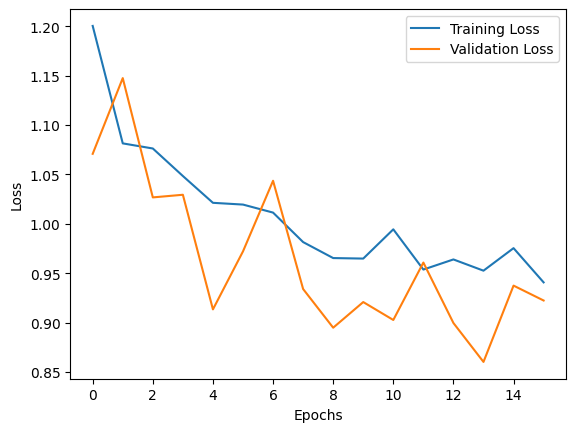

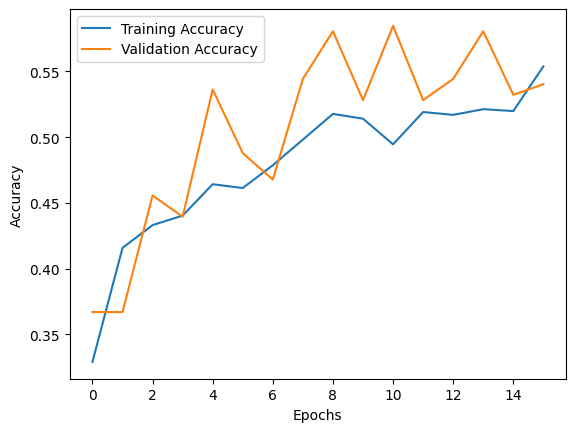

In [20]:
import matplotlib.pyplot as plt
# loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()
from sklearn.metrics import f1_score

1/1 [==============================] - 0s 67ms/step


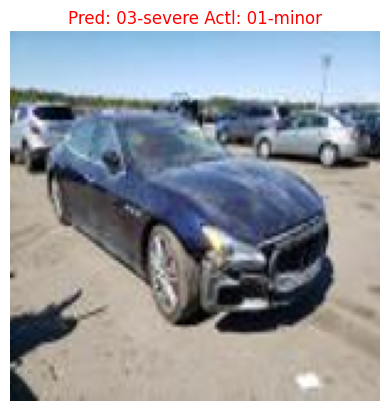

1/1 [==============================] - 0s 59ms/step


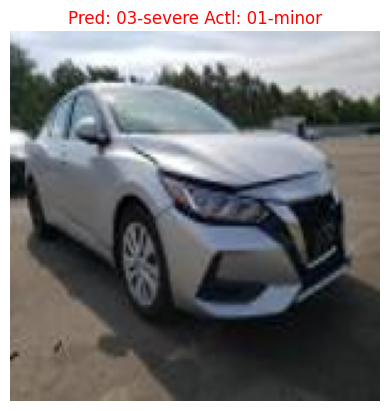

1/1 [==============================] - 0s 55ms/step


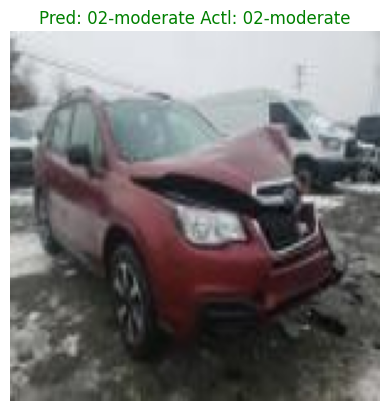

1/1 [==============================] - 0s 27ms/step


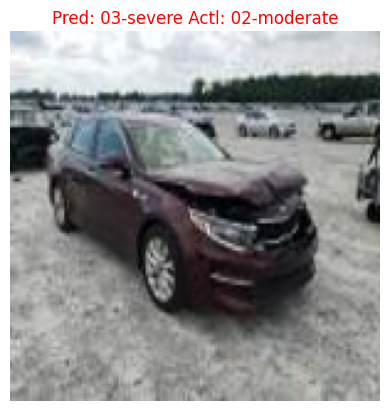

1/1 [==============================] - 0s 41ms/step


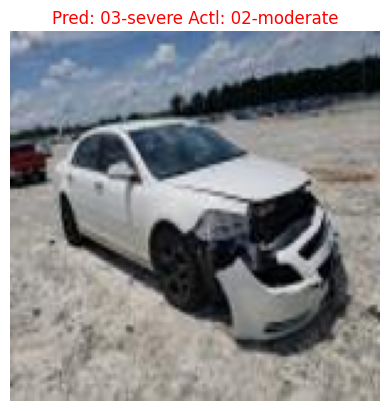

1/1 [==============================] - 0s 31ms/step


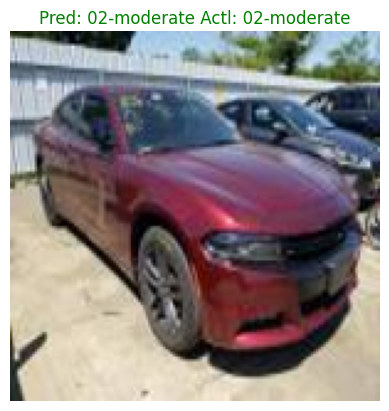

1/1 [==============================] - 0s 24ms/step


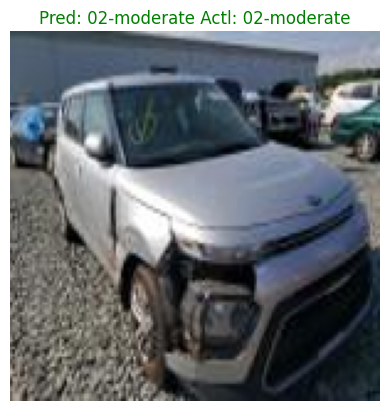

1/1 [==============================] - 0s 25ms/step


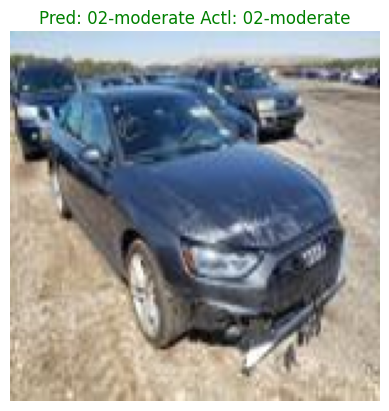

1/1 [==============================] - 0s 27ms/step


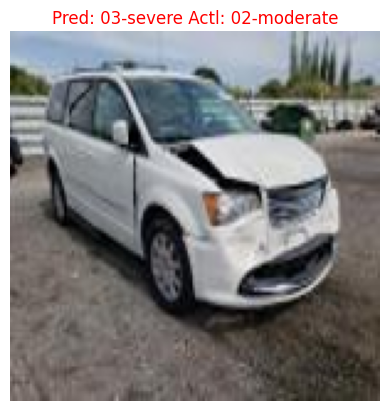

1/1 [==============================] - 0s 27ms/step


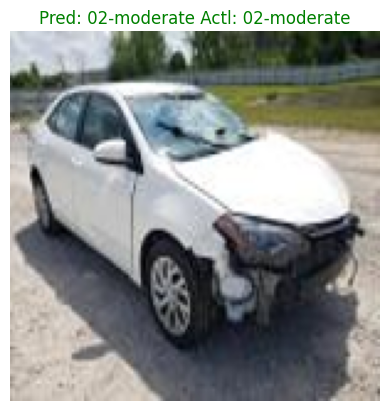

1/1 [==============================] - 0s 24ms/step


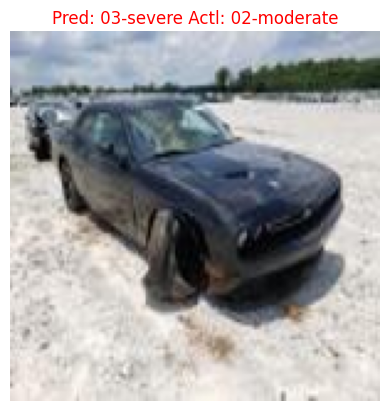

1/1 [==============================] - 0s 24ms/step


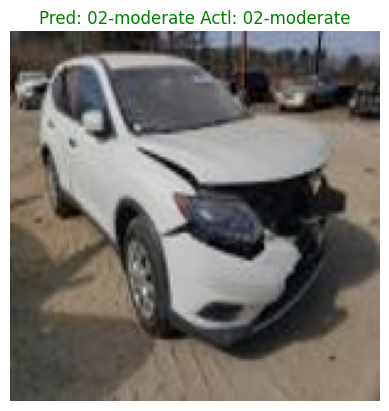

1/1 [==============================] - 0s 21ms/step


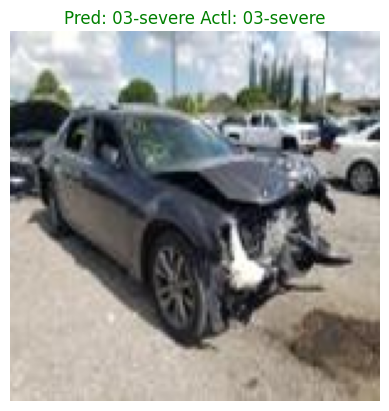

1/1 [==============================] - 0s 26ms/step


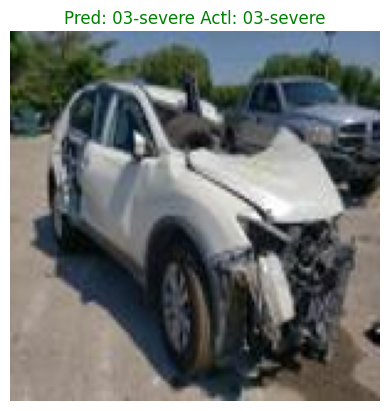

1/1 [==============================] - 0s 28ms/step


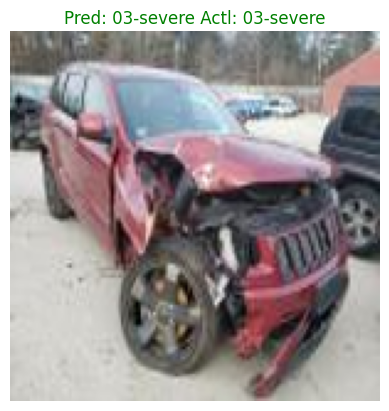

1/1 [==============================] - 0s 27ms/step


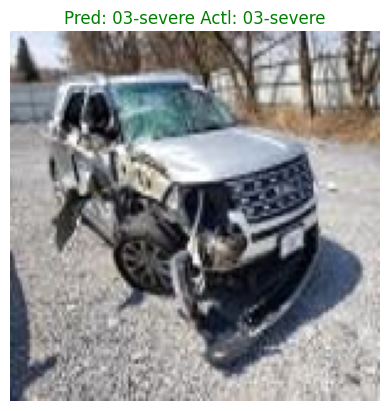

1/1 [==============================] - 0s 28ms/step


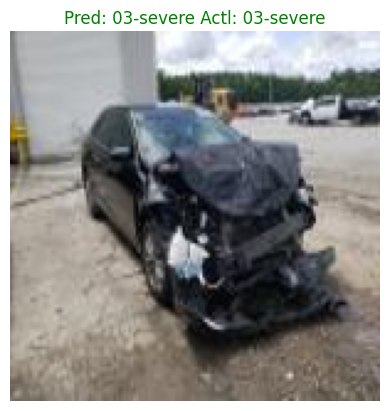

1/1 [==============================] - 0s 25ms/step


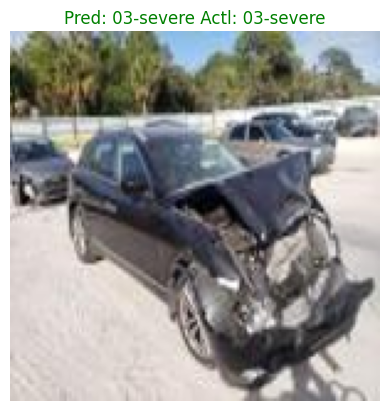

1/1 [==============================] - 0s 34ms/step


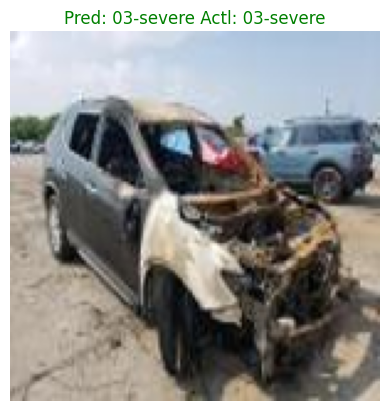

1/1 [==============================] - 0s 29ms/step


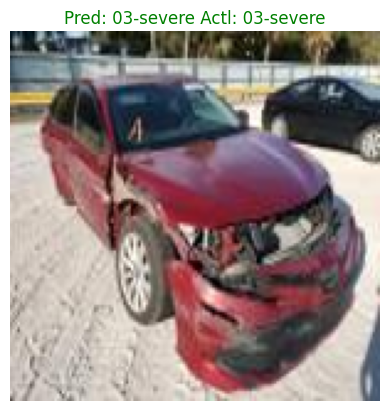

1/1 [==============================] - 0s 27ms/step


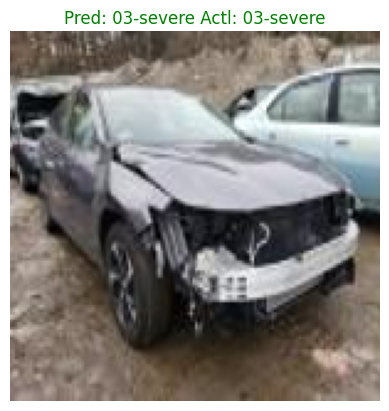

1/1 [==============================] - 0s 32ms/step


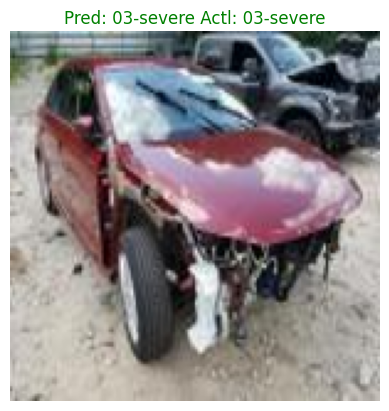

False: 6
True: 16


In [ ]:
import numpy as np
val_dir = '/content/dataset/data3a/validation'
class_names = ["01-minor", "02-moderate", "03-severe"]

image_paths = []
for class_name in class_names:

    folder_path = os.path.join(val_dir, class_name)
    for filename in os.listdir(folder_path):
        if filename.endswith(".jpg") or filename.endswith(".png"):
            image_paths.append(os.path.join(folder_path, filename))
negative = 0
positive = 0
for image_path in image_paths:
    img = tf.keras.preprocessing.image.load_img(image_path)
    img = img.resize((img_width, img_height))
    img = tf.keras.preprocessing.image.img_to_array(img)
    img = img / 255.0
    img = tf.expand_dims(img, axis=0)
    pred = model.predict(img)
    pred_label = class_names[np.argmax(pred)]
    folder_name = os.path.basename(os.path.dirname(image_path))
    plt.imshow(img[0])
    if (pred_label != folder_name):
        plt.title('Pred: ' + pred_label + ' Actl: ' + folder_name, color = 'red')
        negative+=1
    else:
        plt.title('Pred: ' + pred_label + ' Actl: ' + folder_name, color = 'green')
        positive+=1

    plt.axis('off')
    plt.show()
print('False: '+ str(negative) + '\nTrue: ' + str(positive))

8/8 [==============================] - 0s 9ms/step
Confusion Matrix:


<ipython-input-21-93a68dfa9907>:27: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + ['minor', 'moderate', 'severe'], rotation=45)
<ipython-input-21-93a68dfa9907>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + ['minor', 'moderate', 'severe'])


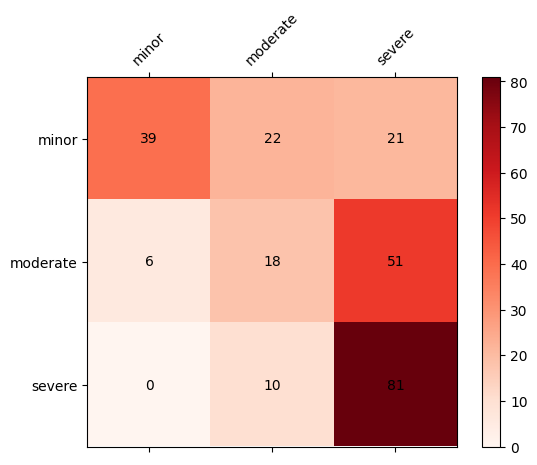

Classification Report:
              precision    recall  f1-score   support

    01-minor       0.87      0.48      0.61        82
 02-moderate       0.36      0.24      0.29        75
   03-severe       0.53      0.89      0.66        91

    accuracy                           0.56       248
   macro avg       0.59      0.54      0.52       248
weighted avg       0.59      0.56      0.53       248



In [ ]:
import numpy as np
val_images, val_labels = [], []
class_names = sorted(train_generator.class_indices.keys())
for i in range(len(val_generator)):
    images, labels = val_generator[i]
    val_images.extend(images)
    val_labels.extend(np.argmax(labels, axis=1))


val_images = np.array(val_images)
val_labels = np.array(val_labels)

predictions = model.predict(val_images)



from sklearn.metrics import confusion_matrix, classification_report

y_pred = np.argmax(predictions, axis=1)
y_true = val_labels

confusion_matrix = confusion_matrix(y_true, y_pred)
fig, ax = plt.subplots()
cax = ax.matshow(confusion_matrix, cmap='Reds')

cbar = fig.colorbar(cax)
ax.set_xticklabels([''] + ['minor', 'moderate', 'severe'], rotation=45)
ax.set_yticklabels([''] + ['minor', 'moderate', 'severe'])

for i in range(confusion_matrix.shape[0]):
    for j in range(confusion_matrix.shape[1]):
        ax.text(j, i, str(confusion_matrix[i, j]), ha='center', va='center')
print('Confusion Matrix:')

plt.show()



report = classification_report(y_true, y_pred, target_names=class_names)
print('Classification Report:')
print(report)

In [41]:
from keras.applications import ResNet50
from keras.models import Model
from keras.layers import Flatten, Dense
from keras.optimizers import SGD
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau


In [42]:
ResNet50_model = ResNet50(weights='imagenet', include_top=False, input_shape=(img_width, img_height,3), classes=3)

for layers in ResNet50_model.layers:
    layers.trainable=True

opt = SGD(lr=0.01,momentum=0.7)
resnet50_x = Flatten()(ResNet50_model.output)
resnet50_x = Dense(256,activation='relu')(resnet50_x)
resnet50_x = Dense(3,activation='softmax')(resnet50_x)
resnet50_x_final_model = Model(inputs=ResNet50_model.input, outputs=resnet50_x)
resnet50_x_final_model.compile(loss = 'categorical_crossentropy', optimizer= opt, metrics=['acc'])

number_of_epochs = 60
resnet_filepath = 'resnet50'+'-saved-model-{epoch:02d}-val_acc-{val_acc:.2f}.hdf5'
resnet_checkpoint = tf.keras.callbacks.ModelCheckpoint(resnet_filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.05, patience=5, min_lr=0.000002)
callbacklist = [resnet_checkpoint,reduce_lr]
resnet50_history = resnet50_x_final_model.fit(train_generator, epochs = number_of_epochs ,validation_data = val_generator,callbacks=callbacklist,verbose=1)


Epoch 1/60
44/44 [==============================] - ETA: 0s - loss: 1.8991 - acc: 0.4960
Epoch 1: val_acc improved from -inf to 0.33065, saving model to resnet50-saved-model-01-val_acc-0.33.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


44/44 [==============================] - 30s 326ms/step - loss: 1.8991 - acc: 0.4960 - val_loss: 1.1525 - val_acc: 0.3306 - lr: 0.0100
Epoch 2/60
44/44 [==============================] - ETA: 0s - loss: 0.8770 - acc: 0.5821
Epoch 2: val_acc did not improve from 0.33065
44/44 [==============================] - 14s 302ms/step - loss: 0.8770 - acc: 0.5821 - val_loss: 2.0752 - val_acc: 0.3306 - lr: 0.0100
Epoch 3/60
44/44 [==============================] - ETA: 0s - loss: 0.8204 - acc: 0.6030
Epoch 3: val_acc did not improve from 0.33065
44/44 [==============================] - 13s 291ms/step - loss: 0.8204 - acc: 0.6030 - val_loss: 4.0057 - val_acc: 0.3306 - lr: 0.0100
Epoch 4/60
44/44 [==============================] - ETA: 0s - loss: 0.8099 - acc: 0.6023
Epoch 4: val_acc did not improve from 0.33065
44/44 [==============================] - 13s 291ms/step - loss: 0.8099 - acc: 0.6023 - val_loss: 5.4300 - val_acc: 0.3306 - lr: 0.0100
Epoch 5/60
44/44 [==============================] - ETA

In [43]:
# Save the trained model
resnet50_x_final_model.save('/content/drive/MyDrive/car_damage_detection/damage_classification/resnet50.h5')


8/8 [==============================] - 2s 61ms/step
Confusion Matrix:


<ipython-input-49-16dd8903ce83>:31: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + ['minor', 'moderate', 'severe'], rotation=45)
<ipython-input-49-16dd8903ce83>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + ['minor', 'moderate', 'severe'])


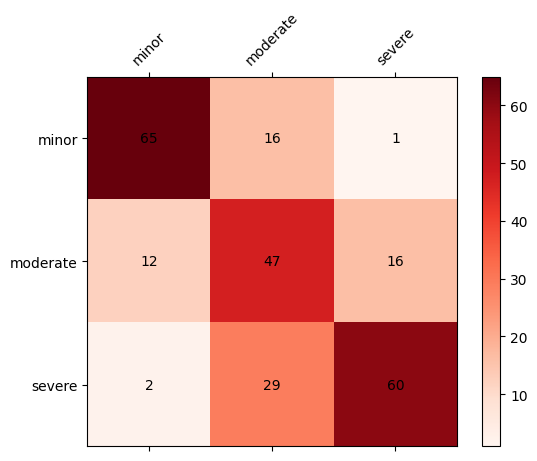

Classification Report:
              precision    recall  f1-score   support

    01-minor       0.82      0.79      0.81        82
 02-moderate       0.51      0.63      0.56        75
   03-severe       0.78      0.66      0.71        91

    accuracy                           0.69       248
   macro avg       0.70      0.69      0.69       248
weighted avg       0.71      0.69      0.70       248



In [49]:
import numpy as np
val_images, val_labels = [], []
class_names = sorted(train_generator.class_indices.keys())
for i in range(len(val_generator)):
    images, labels = val_generator[i]
    val_images.extend(images)
    val_labels.extend(np.argmax(labels, axis=1))


val_images = np.array(val_images)
val_labels = np.array(val_labels)
model2_path= '/content/drive/MyDrive/car_damage_detection/damage_classification/resnet50.h5'

# Load the model

model2 = load_model(model2_path)
predictions = model2.predict(val_images)



from sklearn.metrics import confusion_matrix, classification_report

y_pred = np.argmax(predictions, axis=1)
y_true = val_labels

confusion_matrix = confusion_matrix(y_true, y_pred)
fig, ax = plt.subplots()
cax = ax.matshow(confusion_matrix, cmap='Reds')

cbar = fig.colorbar(cax)
ax.set_xticklabels([''] + ['minor', 'moderate', 'severe'], rotation=45)
ax.set_yticklabels([''] + ['minor', 'moderate', 'severe'])

for i in range(confusion_matrix.shape[0]):
    for j in range(confusion_matrix.shape[1]):
        ax.text(j, i, str(confusion_matrix[i, j]), ha='center', va='center')
print('Confusion Matrix:')

plt.show()



report = classification_report(y_true, y_pred, target_names=class_names)
print('Classification Report:')
print(report)

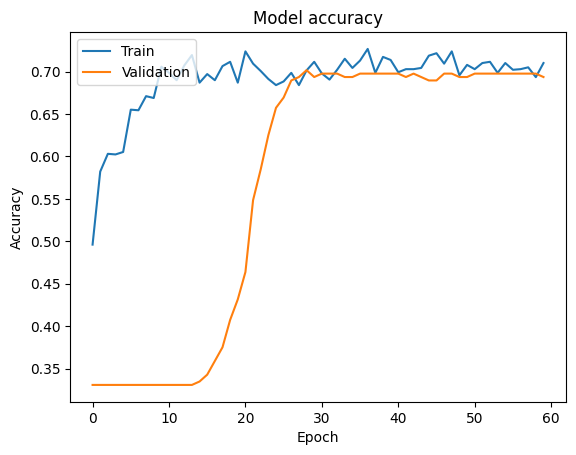

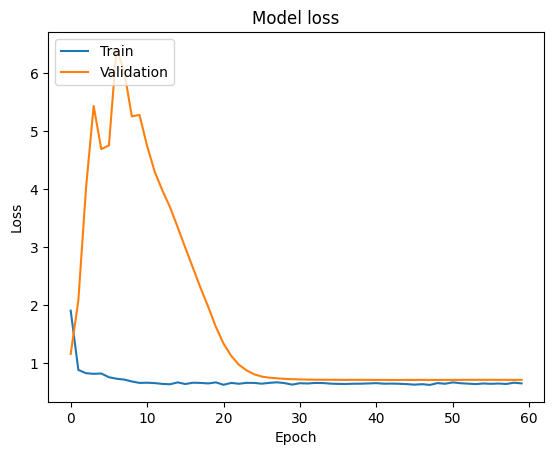

In [44]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Plot training & validation accuracy values
plt.plot(resnet50_history.history['acc'])
plt.plot(resnet50_history.history['val_acc'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(resnet50_history.history['loss'])
plt.plot(resnet50_history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()



1/1 [==============================] - 1s 868ms/step


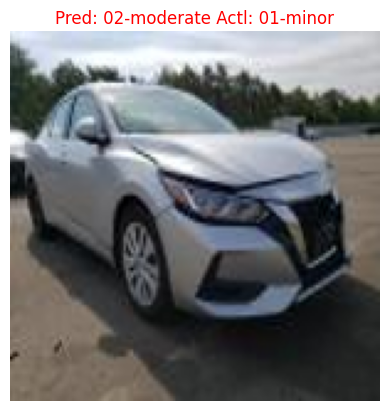

1/1 [==============================] - 0s 23ms/step


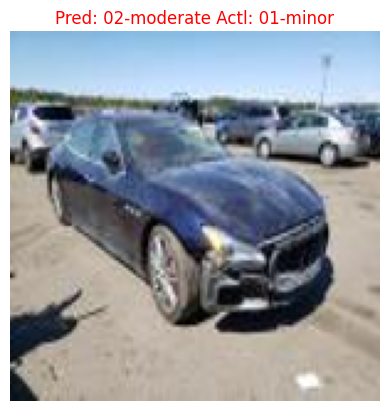

1/1 [==============================] - 0s 22ms/step


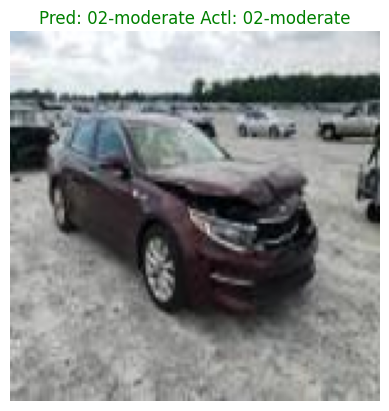

1/1 [==============================] - 0s 23ms/step


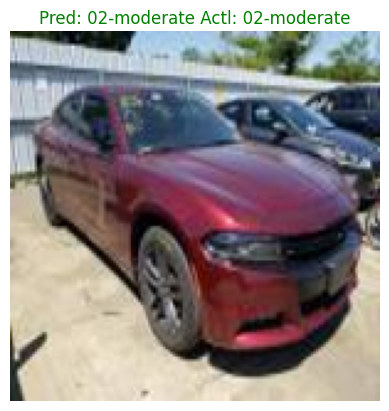

1/1 [==============================] - 0s 25ms/step


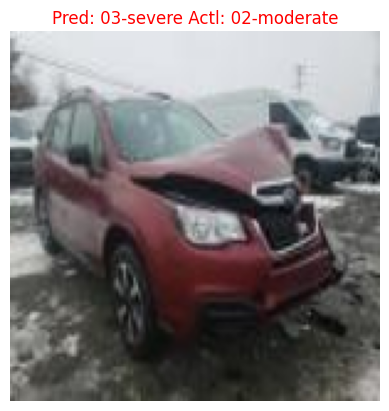

1/1 [==============================] - 0s 24ms/step


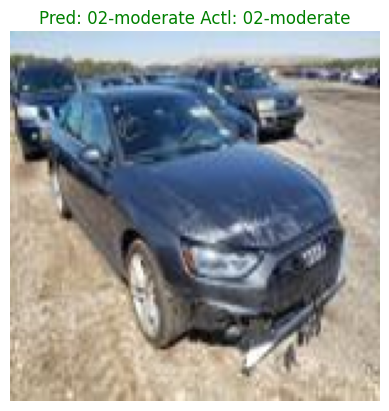

1/1 [==============================] - 0s 31ms/step


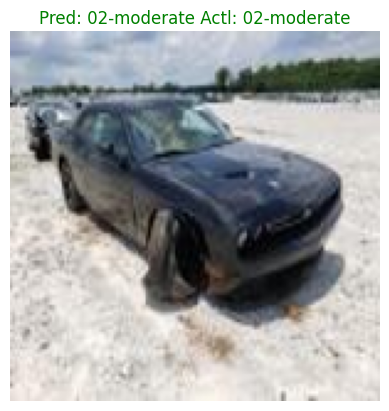

1/1 [==============================] - 0s 22ms/step


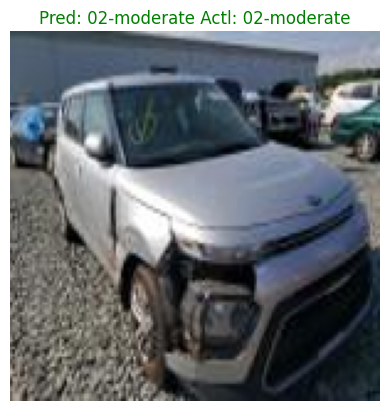

1/1 [==============================] - 0s 24ms/step


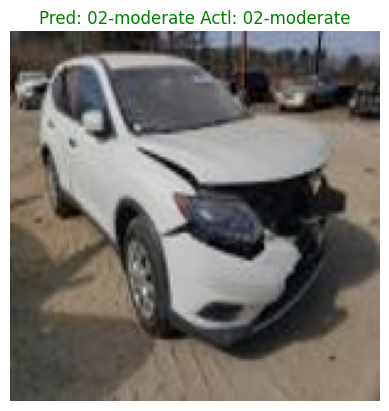

1/1 [==============================] - 0s 21ms/step


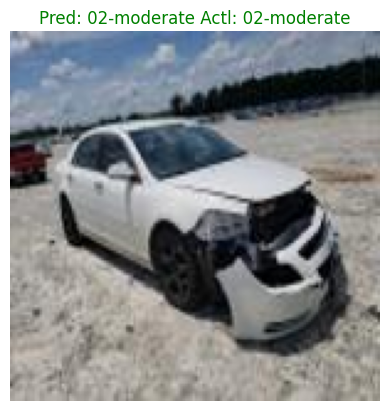

1/1 [==============================] - 0s 22ms/step


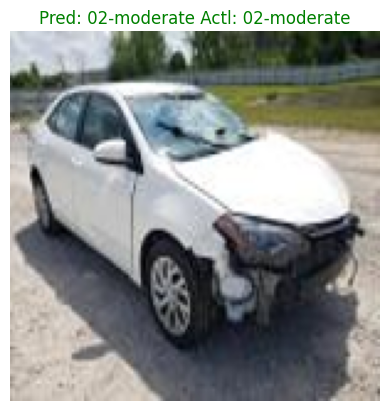

1/1 [==============================] - 0s 31ms/step


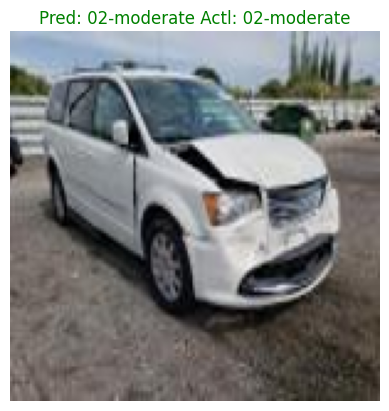

1/1 [==============================] - 0s 27ms/step


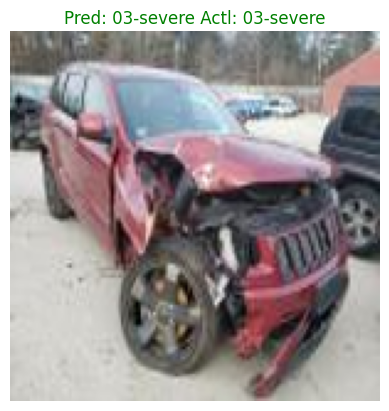

1/1 [==============================] - 0s 22ms/step


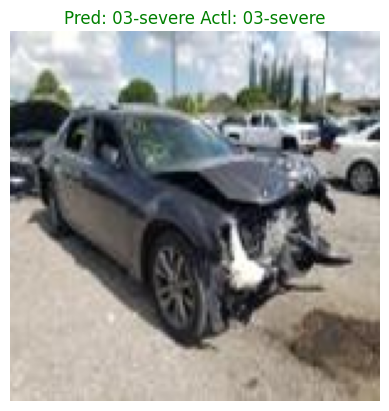

1/1 [==============================] - 0s 32ms/step


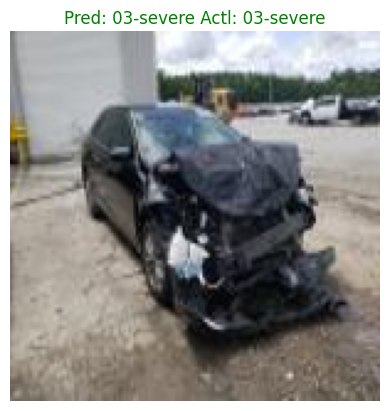

1/1 [==============================] - 0s 26ms/step


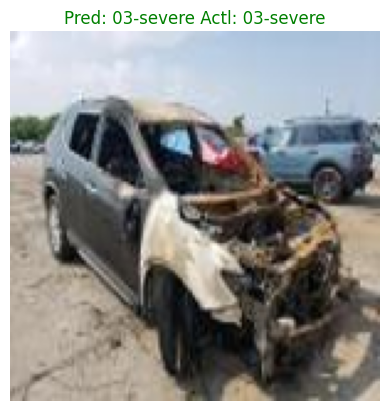

1/1 [==============================] - 0s 35ms/step


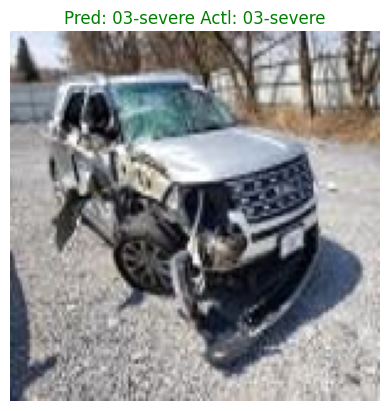

1/1 [==============================] - 0s 38ms/step


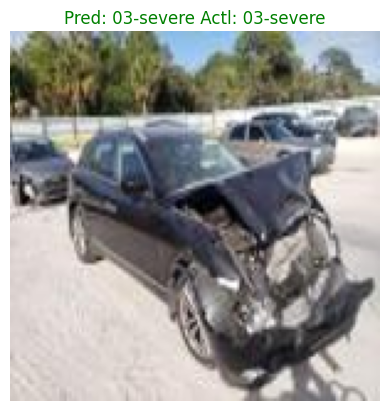

1/1 [==============================] - 0s 32ms/step


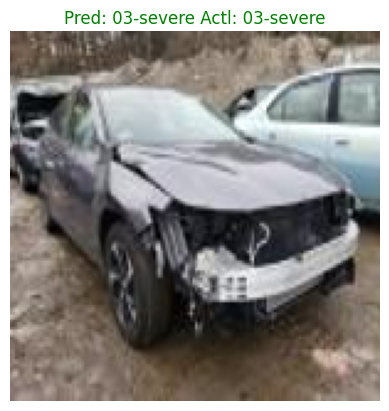

1/1 [==============================] - 0s 30ms/step


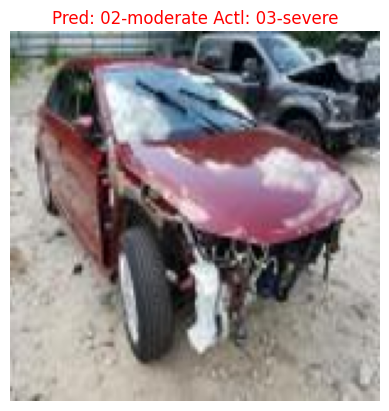

1/1 [==============================] - 0s 50ms/step


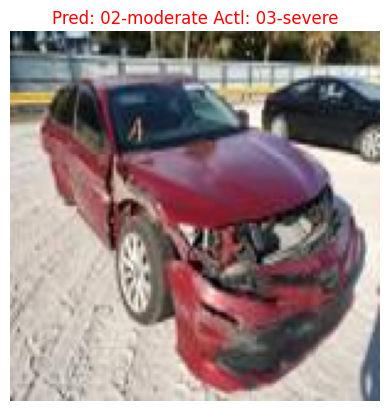

1/1 [==============================] - 0s 32ms/step


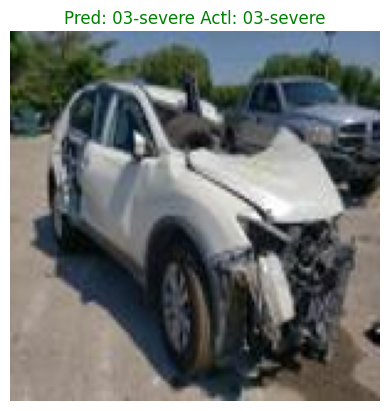

False: 5
True: 17


In [45]:
import numpy as np
val_dir = '/content/dataset/data3a/validation'
class_names = ["01-minor", "02-moderate", "03-severe"]

image_paths = []
for class_name in class_names:

    folder_path = os.path.join(val_dir, class_name)
    for filename in os.listdir(folder_path):
        if filename.endswith(".jpg") or filename.endswith(".png"):
            image_paths.append(os.path.join(folder_path, filename))
negative = 0
positive = 0
for image_path in image_paths:
    img = tf.keras.preprocessing.image.load_img(image_path)
    img = img.resize((img_width, img_height))
    img = tf.keras.preprocessing.image.img_to_array(img)
    img = img / 255.0
    img = tf.expand_dims(img, axis=0)
    pred = resnet50_x_final_model.predict(img)
    pred_label = class_names[np.argmax(pred)]
    folder_name = os.path.basename(os.path.dirname(image_path))
    plt.imshow(img[0])
    if (pred_label != folder_name):
        plt.title('Pred: ' + pred_label + ' Actl: ' + folder_name, color = 'red')
        negative+=1
    else:
        plt.title('Pred: ' + pred_label + ' Actl: ' + folder_name, color = 'green')
        positive+=1

    plt.axis('off')
    plt.show()
print('False: '+ str(negative) + '\nTrue: ' + str(positive))

In [28]:
from tensorflow.keras.applications import VGG16


In [36]:
vgg16_model = VGG16(pooling='avg', weights='imagenet', include_top=False, input_shape=(150,150,3))
for layers in vgg16_model.layers:
            layers.trainable=False
last_output = vgg16_model.layers[-1].output
vgg_x = Flatten()(last_output)
vgg_x = Dense(128, activation = 'relu')(vgg_x)
vgg_x = Dense(3, activation = 'softmax')(vgg_x)
vgg16_final_model = Model(vgg16_model.input, vgg_x)
vgg16_final_model.compile(loss = 'categorical_crossentropy', optimizer= 'adam', metrics=['acc'])

# VGG16
number_of_epochs = 30
vgg16_filepath = 'vgg_16_'+'-saved-model-{epoch:02d}-acc-{val_acc:.2f}.hdf5'
vgg_checkpoint = tf.keras.callbacks.ModelCheckpoint(vgg16_filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
vgg16_history = vgg16_final_model.fit(train_generator, epochs = number_of_epochs ,validation_data = val_generator,callbacks=[vgg_checkpoint],verbose=1)


Epoch 1/30
44/44 [==============================] - ETA: 0s - loss: 0.9549 - acc: 0.5228
Epoch 1: val_acc improved from -inf to 0.64113, saving model to vgg_16_-saved-model-01-acc-0.64.hdf5
44/44 [==============================] - 11s 214ms/step - loss: 0.9549 - acc: 0.5228 - val_loss: 0.7738 - val_acc: 0.6411
Epoch 2/30


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


44/44 [==============================] - ETA: 0s - loss: 0.8651 - acc: 0.5524
Epoch 2: val_acc improved from 0.64113 to 0.69355, saving model to vgg_16_-saved-model-02-acc-0.69.hdf5
44/44 [==============================] - 11s 258ms/step - loss: 0.8651 - acc: 0.5524 - val_loss: 0.7134 - val_acc: 0.6935
Epoch 3/30
44/44 [==============================] - ETA: 0s - loss: 0.8468 - acc: 0.6023
Epoch 3: val_acc did not improve from 0.69355
44/44 [==============================] - 14s 328ms/step - loss: 0.8468 - acc: 0.6023 - val_loss: 0.7219 - val_acc: 0.6573
Epoch 4/30
44/44 [==============================] - ETA: 0s - loss: 0.8226 - acc: 0.6030
Epoch 4: val_acc did not improve from 0.69355
44/44 [==============================] - 12s 280ms/step - loss: 0.8226 - acc: 0.6030 - val_loss: 0.8560 - val_acc: 0.5363
Epoch 5/30
44/44 [==============================] - ETA: 0s - loss: 0.8238 - acc: 0.6001
Epoch 5: val_acc did not improve from 0.69355
44/44 [==============================] - 11s 25

In [37]:
# Save the trained VGG16 model
vgg16_final_model.save('/content/drive/MyDrive/car_damage_detection/damage_classification/vgg16.h5')


8/8 [==============================] - 1s 72ms/step
Confusion Matrix:


<ipython-input-51-85ac09265b2a>:31: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + ['minor', 'moderate', 'severe'], rotation=45)
<ipython-input-51-85ac09265b2a>:32: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + ['minor', 'moderate', 'severe'])


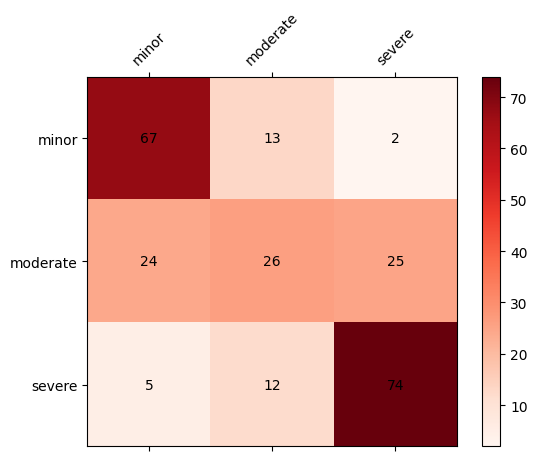

Classification Report:
              precision    recall  f1-score   support

    01-minor       0.70      0.82      0.75        82
 02-moderate       0.51      0.35      0.41        75
   03-severe       0.73      0.81      0.77        91

    accuracy                           0.67       248
   macro avg       0.65      0.66      0.65       248
weighted avg       0.65      0.67      0.66       248



In [51]:
import numpy as np
val_images, val_labels = [], []
class_names = sorted(train_generator.class_indices.keys())
for i in range(len(val_generator)):
    images, labels = val_generator[i]
    val_images.extend(images)
    val_labels.extend(np.argmax(labels, axis=1))


val_images = np.array(val_images)
val_labels = np.array(val_labels)
model2_path= '/content/drive/MyDrive/car_damage_detection/damage_classification/vgg16.h5'

# Load the model

model2 = load_model(model2_path)
predictions = model2.predict(val_images)



from sklearn.metrics import confusion_matrix, classification_report

y_pred = np.argmax(predictions, axis=1)
y_true = val_labels

confusion_matrix = confusion_matrix(y_true, y_pred)
fig, ax = plt.subplots()
cax = ax.matshow(confusion_matrix, cmap='Reds')

cbar = fig.colorbar(cax)
ax.set_xticklabels([''] + ['minor', 'moderate', 'severe'], rotation=45)
ax.set_yticklabels([''] + ['minor', 'moderate', 'severe'])

for i in range(confusion_matrix.shape[0]):
    for j in range(confusion_matrix.shape[1]):
        ax.text(j, i, str(confusion_matrix[i, j]), ha='center', va='center')
print('Confusion Matrix:')

plt.show()



report = classification_report(y_true, y_pred, target_names=class_names)
print('Classification Report:')
print(report)

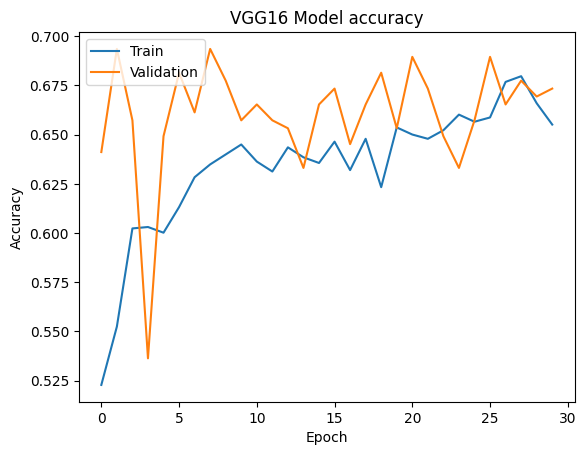

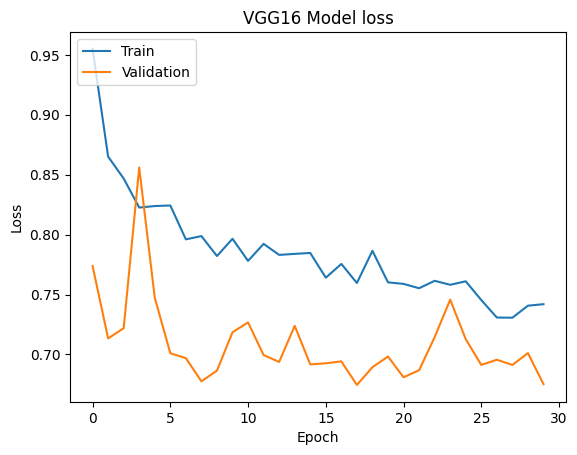

8/8 [==============================] - 1s 73ms/step


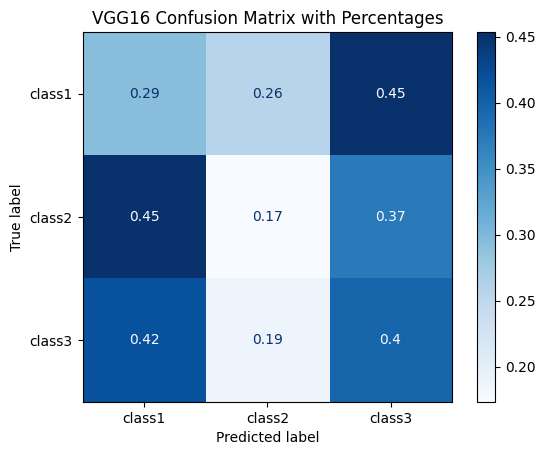

In [38]:
# Plot training & validation accuracy values
plt.plot(vgg16_history.history['acc'])
plt.plot(vgg16_history.history['val_acc'])
plt.title('VGG16 Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(vgg16_history.history['loss'])
plt.plot(vgg16_history.history['val_loss'])
plt.title('VGG16 Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Confusion matrix with percentages
val_preds_vgg = vgg16_final_model.predict(val_generator)
val_preds_classes_vgg = np.argmax(val_preds_vgg, axis=1)
val_true_classes_vgg = val_generator.classes

cm_vgg = confusion_matrix(val_true_classes_vgg, val_preds_classes_vgg)
cm_percentages = cm_vgg.astype('float') / cm_vgg.sum(axis=1)[:, np.newaxis]  # Calculate percentages

disp_vgg = ConfusionMatrixDisplay(confusion_matrix=cm_percentages, display_labels=['class1', 'class2', 'class3'])  # Replace with your class labels
disp_vgg.plot(cmap=plt.cm.Blues)
plt.title('VGG16 Confusion Matrix with Percentages')
plt.show()


1/1 [==============================] - 0s 144ms/step


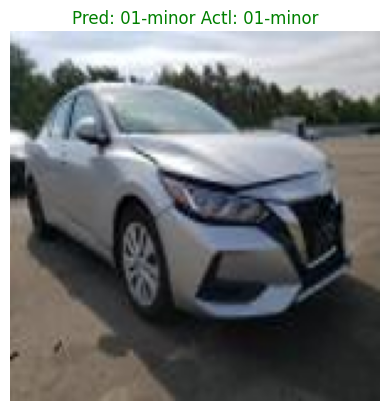

1/1 [==============================] - 0s 21ms/step


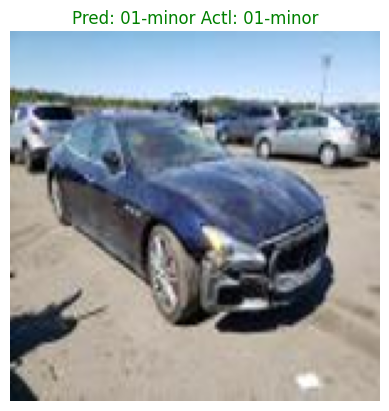

1/1 [==============================] - 0s 17ms/step


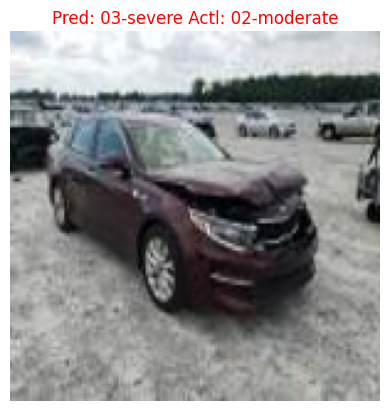

1/1 [==============================] - 0s 17ms/step


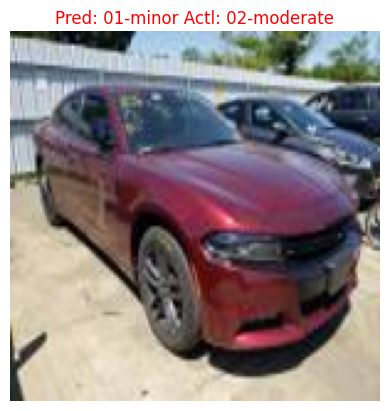

1/1 [==============================] - 0s 18ms/step


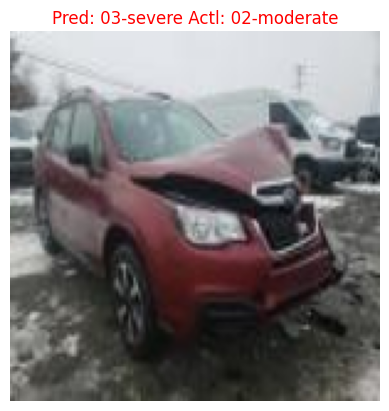

1/1 [==============================] - 0s 18ms/step


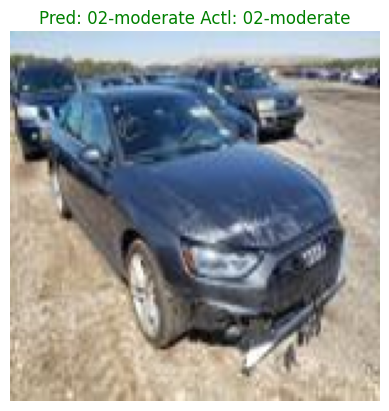

1/1 [==============================] - 0s 35ms/step


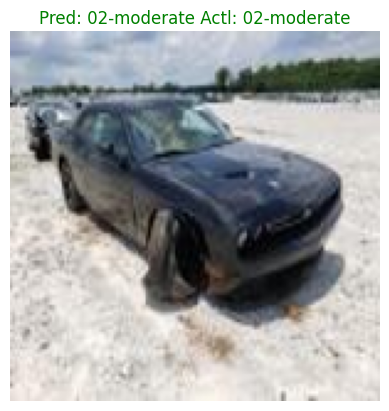

1/1 [==============================] - 0s 51ms/step


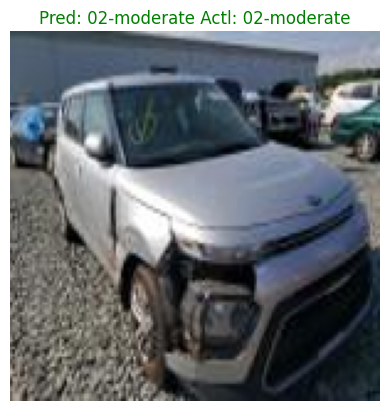

1/1 [==============================] - 0s 31ms/step


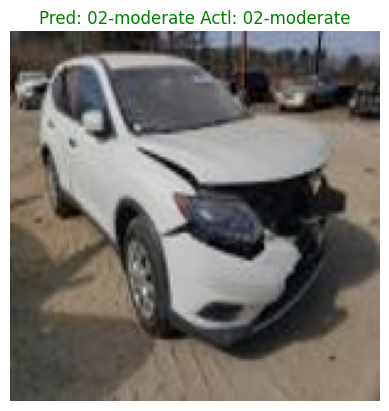

1/1 [==============================] - 0s 36ms/step


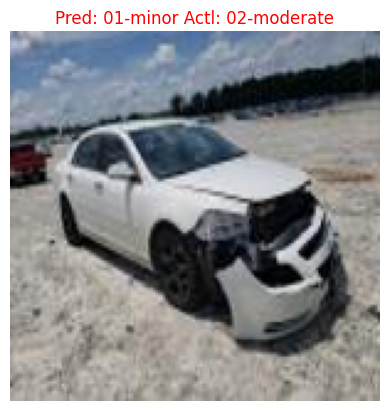

1/1 [==============================] - 0s 33ms/step


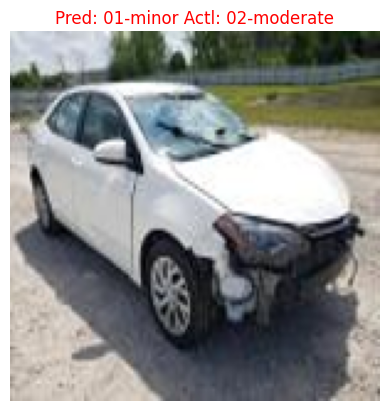

1/1 [==============================] - 0s 42ms/step


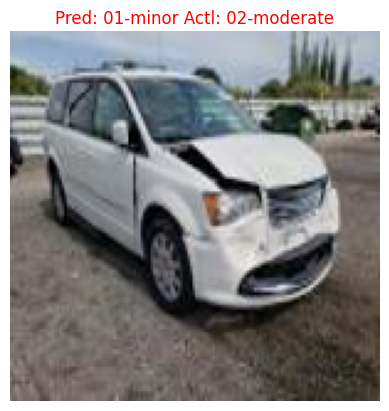

1/1 [==============================] - 0s 31ms/step


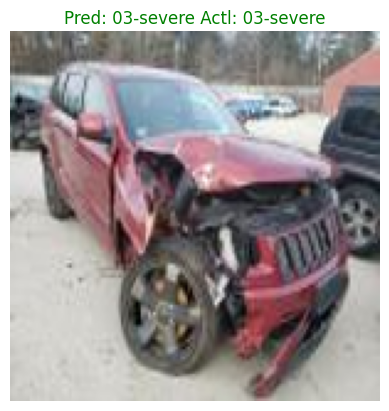

1/1 [==============================] - 0s 31ms/step


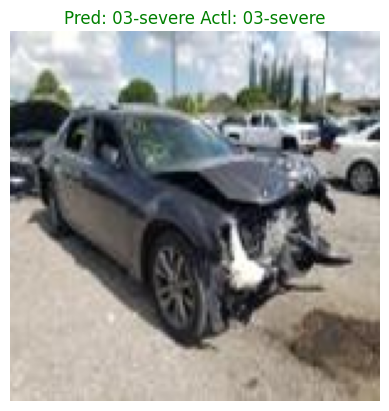

1/1 [==============================] - 0s 42ms/step


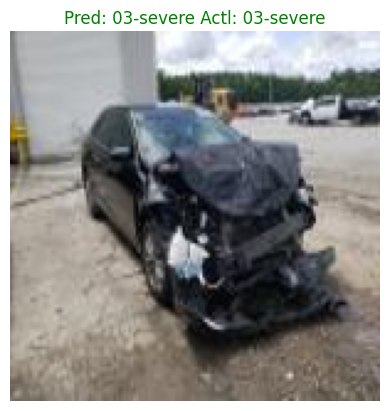

1/1 [==============================] - 0s 26ms/step


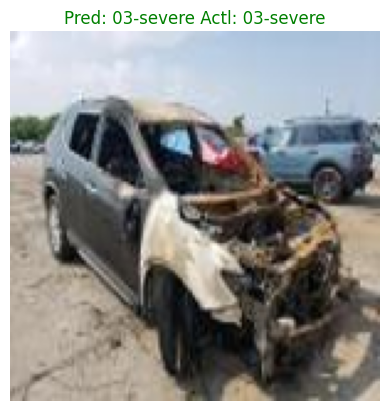

1/1 [==============================] - 0s 26ms/step


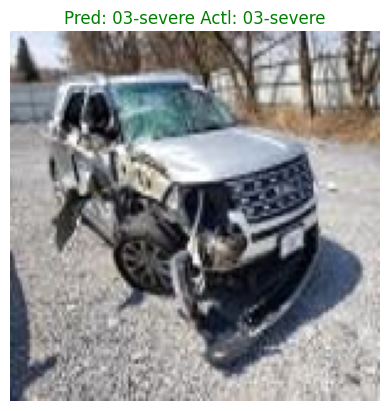

1/1 [==============================] - 0s 25ms/step


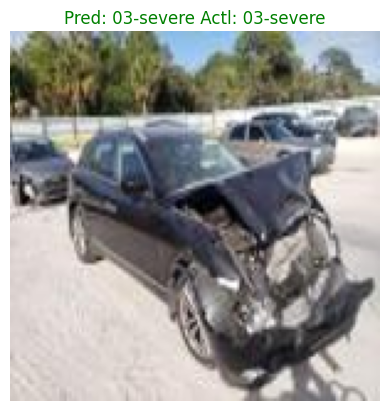

1/1 [==============================] - 0s 29ms/step


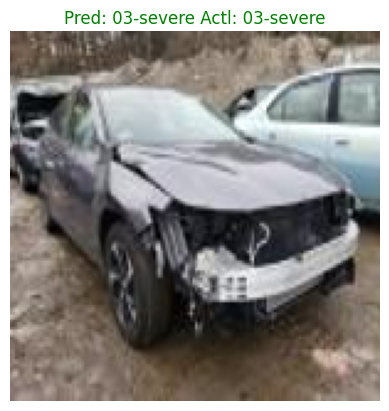

1/1 [==============================] - 0s 26ms/step


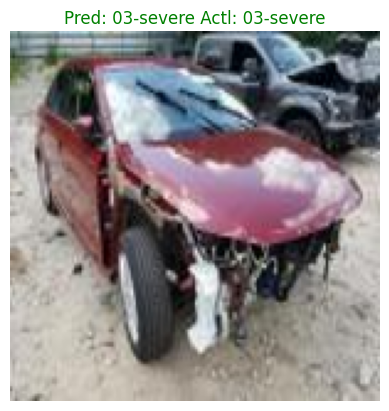

1/1 [==============================] - 0s 47ms/step


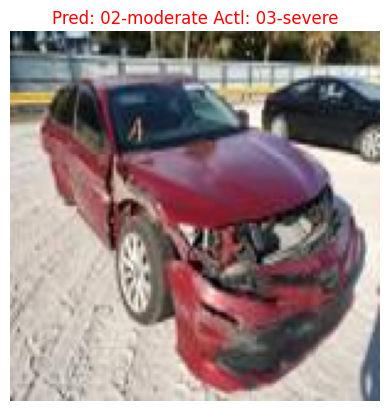

1/1 [==============================] - 0s 40ms/step


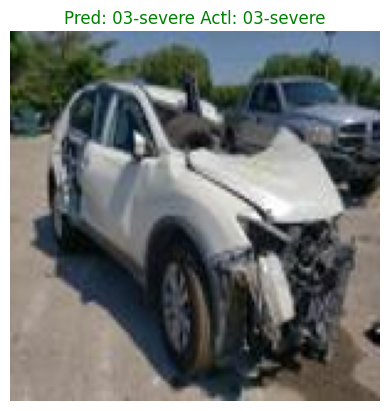

False: 7
True: 15


In [39]:
import numpy as np
val_dir = '/content/dataset/data3a/validation'
class_names = ["01-minor", "02-moderate", "03-severe"]

image_paths = []
for class_name in class_names:

    folder_path = os.path.join(val_dir, class_name)
    for filename in os.listdir(folder_path):
        if filename.endswith(".jpg") or filename.endswith(".png"):
            image_paths.append(os.path.join(folder_path, filename))
negative = 0
positive = 0
for image_path in image_paths:
    img = tf.keras.preprocessing.image.load_img(image_path)
    img = img.resize((img_width, img_height))
    img = tf.keras.preprocessing.image.img_to_array(img)
    img = img / 255.0
    img = tf.expand_dims(img, axis=0)
    pred = vgg16_final_model.predict(img)
    pred_label = class_names[np.argmax(pred)]
    folder_name = os.path.basename(os.path.dirname(image_path))
    plt.imshow(img[0])
    if (pred_label != folder_name):
        plt.title('Pred: ' + pred_label + ' Actl: ' + folder_name, color = 'red')
        negative+=1
    else:
        plt.title('Pred: ' + pred_label + ' Actl: ' + folder_name, color = 'green')
        positive+=1

    plt.axis('off')
    plt.show()
print('False: '+ str(negative) + '\nTrue: ' + str(positive))

In [52]:
from tensorflow.keras.models import load_model

# Path to your saved model
model_path = '/content/drive/MyDrive/car_damage_detection/damage_classification/cnn.h5'
model2_path= '/content/drive/MyDrive/car_damage_detection/damage_classification/resnet50.h5'
model3_path= '/content/drive/MyDrive/car_damage_detection/damage_classification/vgg16.h5'
# Load the model
model = load_model(model_path)
model2 = load_model(model2_path)
model3 = load_model(model3_path)

8/8 [==============================] - 1s 59ms/step


<ipython-input-53-0e854d48c671>:35: UserWarning: FixedFormatter should only be used together with FixedLocator
  axis.set_xticklabels([''] + class_names, rotation=45)
<ipython-input-53-0e854d48c671>:36: UserWarning: FixedFormatter should only be used together with FixedLocator
  axis.set_yticklabels([''] + class_names)
<ipython-input-53-0e854d48c671>:35: UserWarning: FixedFormatter should only be used together with FixedLocator
  axis.set_xticklabels([''] + class_names, rotation=45)
<ipython-input-53-0e854d48c671>:36: UserWarning: FixedFormatter should only be used together with FixedLocator
  axis.set_yticklabels([''] + class_names)
<ipython-input-53-0e854d48c671>:35: UserWarning: FixedFormatter should only be used together with FixedLocator
  axis.set_xticklabels([''] + class_names, rotation=45)
<ipython-input-53-0e854d48c671>:36: UserWarning: FixedFormatter should only be used together with FixedLocator
  axis.set_yticklabels([''] + class_names)


Classification Report for Model 1:
              precision    recall  f1-score   support

    01-minor       0.91      0.37      0.52        82
 02-moderate       0.33      0.27      0.30        75
   03-severe       0.54      0.92      0.68        91

    accuracy                           0.54       248
   macro avg       0.59      0.52      0.50       248
weighted avg       0.60      0.54      0.51       248

Classification Report for Model 2:
              precision    recall  f1-score   support

    01-minor       0.82      0.79      0.81        82
 02-moderate       0.51      0.63      0.56        75
   03-severe       0.78      0.66      0.71        91

    accuracy                           0.69       248
   macro avg       0.70      0.69      0.69       248
weighted avg       0.71      0.69      0.70       248

Classification Report for Model 3:
              precision    recall  f1-score   support

    01-minor       0.70      0.82      0.75        82
 02-moderate       0.51 

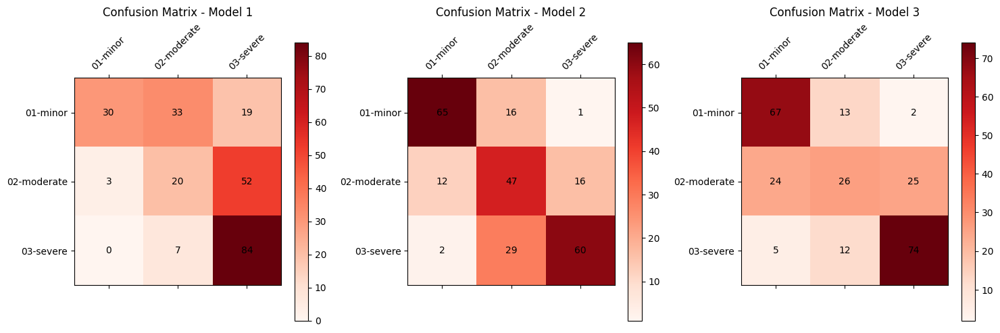

In [53]:
import numpy as np
val_images, val_labels = [], []
class_names = sorted(train_generator.class_indices.keys())
for i in range(len(val_generator)):
    images, labels = val_generator[i]
    val_images.extend(images)
    val_labels.extend(np.argmax(labels, axis=1))


val_images = np.array(val_images)
val_labels = np.array(val_labels)

predictions1 = model.predict(val_images)
predictions2 = model2.predict(val_images)
predictions3 = model3.predict(val_images)


import numpy as np
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt

# Supposons que vous avez déjà défini vos modèles et vos données de validation

# Fonction pour afficher la matrice de confusion et le rapport de classification
def plot_confusion_and_report(model_name, predictions, val_labels, class_names, axis):
    y_pred = np.argmax(predictions, axis=1)
    y_true = val_labels

    # Calcul de la matrice de confusion
    confusion_mat = confusion_matrix(y_true, y_pred)

    # Affichage de la matrice de confusion
    cax = axis.matshow(confusion_mat, cmap='Reds')
    fig.colorbar(cax, ax=axis)
    axis.set_xticklabels([''] + class_names, rotation=45)
    axis.set_yticklabels([''] + class_names)

    for i in range(confusion_mat.shape[0]):
        for j in range(confusion_mat.shape[1]):
            axis.text(j, i, str(confusion_mat[i, j]), ha='center', va='center')

    axis.set_title(f'Confusion Matrix - {model_name}')

    # Calcul du rapport de classification
    report = classification_report(y_true, y_pred, target_names=class_names)
    print(f'Classification Report for {model_name}:')
    print(report)

# Supposons que vous avez déjà défini vos prédictions pour chaque modèle : predictions1, predictions2, predictions3
# Et vos données de validation : val_images et val_labels

# Obtention des noms de classe pour les étiquettes
class_names = sorted(train_generator.class_indices.keys())  # Assurez-vous que ces classes correspondent à votre problème

# Création des sous-graphiques pour afficher les matrices de confusion
fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # 1 ligne, 3 colonnes

# Affichage des matrices de confusion et des rapports de classification pour chaque modèle
plot_confusion_and_report('Model 1', predictions1, val_labels, class_names, axes[0])
plot_confusion_and_report('Model 2', predictions2, val_labels, class_names, axes[1])
plot_confusion_and_report('Model 3', predictions3, val_labels, class_names, axes[2])

plt.tight_layout()
plt.show()
